In [ ]:
!pip install pydicom

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
os.chdir('/content/drive/MyDrive/imageprocessing')

In [ ]:
import os
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow import keras
import pydicom


plt.set_cmap('gray')
%matplotlib inline

# Seeding
seed = 2019
random.seed(seed)
np.random.seed(seed)

IMG_DTYPE = np.float64
SEG_DTYPE = np.uint8

<Figure size 640x480 with 0 Axes>

In [ ]:
def show_image(*args, **kwargs):
    cmap = kwargs.get('cmap', 'gray')
    title = kwargs.get('title', '')
    if len(args) == 0:
        raise ValueError("No images given to show_image")
    elif len(args) == 1:
        plt.title(title)
        plt.imshow(args[0], interpolation='none')
    else:
        n = len(args)
        if type(cmap) == str:
            cmap = [cmap] * n
        if type(title) == str:
            title = [title] * n
        plt.figure(figsize=(n * 5, 10))
        for i in range(n):
            plt.subplot(1, n, i + 1)
            plt.axis('off')
            plt.title(title[i])
            plt.imshow(args[i], cmap[i])
    plt.show()

def normalize_img(img):
    """ Normalize image values to [0,1] """
    min_val, max_val = float(np.min(img)), float(np.max(img))
    return (img - min_val) / (max_val - min_val)

In [ ]:
def preprocess_img_slice(img_slc):

    img_slc[img_slc > 1200] = 0
    img_slc = np.clip(img_slc, -100, 400)
    img_slc = normalize_img(img_slc)

    img_slc = img_slc * 255
    img_slc = img_slc.astype('uint8')
    img_slc = cv2.equalizeHist(img_slc)
    img_slc = normalize_img(img_slc)
    return img_slc

In [ ]:
class DataGenerator(keras.utils.Sequence):
    def __init__(self, ids, path, batch_size=8, image_size=128):
        self.ids = ids
        self.path = path
        self.batch_size = batch_size
        self.image_size = image_size
        self.on_epoch_end()

    def load_data(self, id_name):
        patient_id = id_name.split('_')
        image_path = os.path.join(self.path, "patients", id_name)
        mask_path = os.path.join(self.path, "masks")
        all_masks = os.listdir(mask_path)
        dicom_image = pydicom.dcmread(image_path)
        image = preprocess_img_slice(dicom_image.pixel_array)
        image = normalize_img(image)
        image = np.array(Image.fromarray(image).resize([self.image_size, self.image_size])).astype(IMG_DTYPE)

        mask = pydicom.dcmread(os.path.join(mask_path, patient_id[0]+'_liver', id_name)).pixel_array
        mask = mask / 255.0
        mask = np.clip(mask, 0, 1)
        mask = np.array(Image.fromarray(mask).resize([self.image_size, self.image_size])).astype(IMG_DTYPE)
        mask = mask[:, :, np.newaxis]
        return image, mask

    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.ids):
            self.batch_size = len(self.ids) - index * self.batch_size

        files_batch = self.ids[index * self.batch_size: (index + 1) * self.batch_size]

        images = []
        masks = []

        for id_name in files_batch:
            img, mask = self.load_data(id_name)
            img = np.stack((img,) * 3, axis=-1)
            images.append(img)
            masks.append(mask)

        images = np.array(images)
        masks = np.array(masks)

        return images, masks

    def on_epoch_end(self):
        pass

    def __len__(self):
        return int(np.ceil(len(self.ids) / float(self.batch_size)))


In [ ]:
image_size = 256
train_path = "train"
batch_size = 16
epochs = 15

# Training Ids
all_images = []
for file in os.listdir(os.path.join(train_path, "patients")):
    all_images.append(file)

# Randomly select 50% of the data
selected_ids = random.sample(all_images, int(0.50 * len(all_images)))

# Divide into training and validation sets
val_data_size = len(selected_ids) // 5
validation_ids = selected_ids[:val_data_size]
training_ids = selected_ids[val_data_size:]

# Create into test and validation subsets
test_val_split = len(validation_ids) // 2
test_ids = validation_ids[:test_val_split]
valid_ids = validation_ids[test_val_split:]

# Print lengths of the sets
print("Number of training samples:", len(training_ids))
print("Number of test samples:", len(test_ids))
print("Number of validation samples:", len(valid_ids))

Number of training samples: 9308
Number of test samples: 1163
Number of validation samples: 1164


# Visualizing results of Liver Segmentation

In [ ]:
def visualize(model,data_gen):
  # Display images in a loop
  count = 0
  for i in range(4, 7, 1):
      x, y = data_gen.__getitem__(i)
      result = model_25.predict(x)

      result = result > 0.8
      print(len(result))
      for j in range(len(result)-5):
          fig, axes = plt.subplots(1, 3, figsize=(15, 5))
          axes[0].imshow(x[j], cmap="gray")
          axes[0].set_title("Input Image")
          axes[0].axis('off')

          axes[1].imshow(np.reshape(y[j] * 255, (image_size, image_size)), cmap="gray")
          axes[1].set_title("Ground Truth (Liver mask)")
          axes[1].axis('off')

          axes[2].imshow(np.reshape(result[j] * 255, (image_size, image_size)), cmap="gray")
          axes[2].set_title("ResUnet Liver Segmentation")
          axes[2].axis('off')

          plt.show()


##You can change your model here.

In [ ]:
model_25 = keras.models.load_model(os.path.join('models','liver_segmentation_25percent.h5'), compile= False)
#valid_gen_25 =DataGenerator(validation_ids, train_path, image_size=image_size, batch_size=batch_size)

#visualize(model_25,valid_gen_25)

# Visualizing results on test set (when ResUnet is trained on 25% of our data)


1/1 [==============================] - 12s 12s/step


16


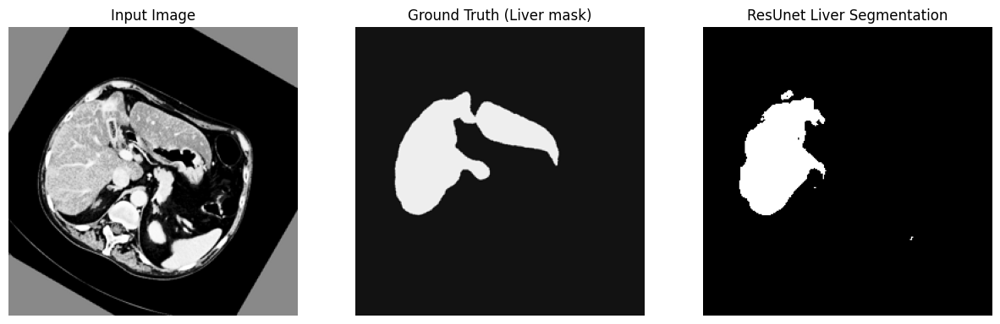

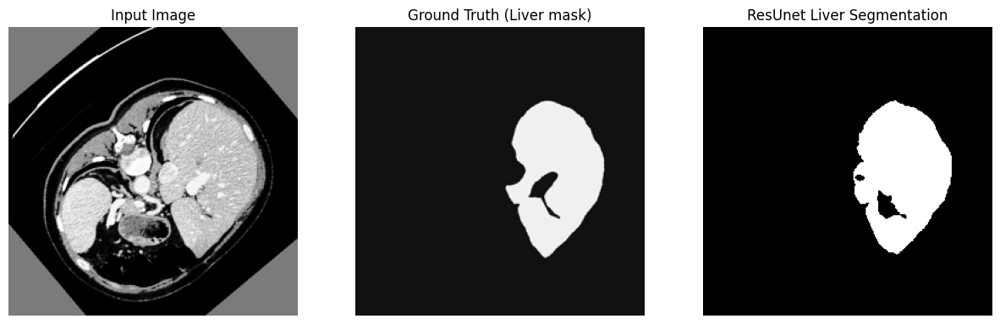

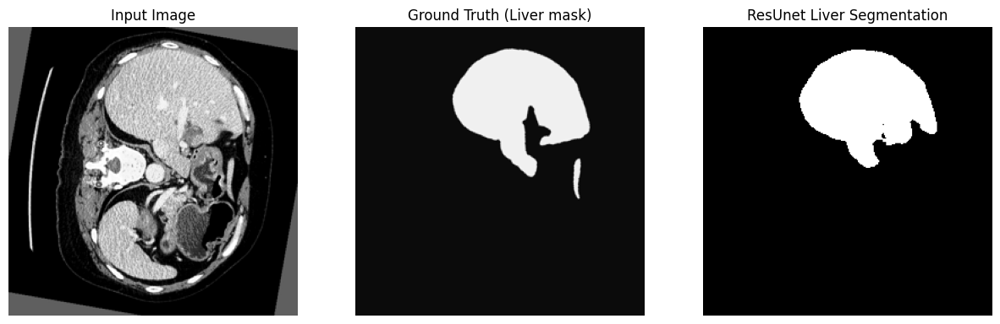

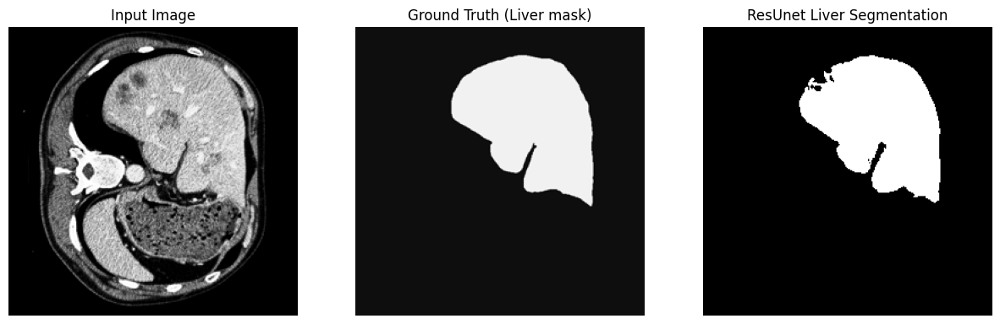

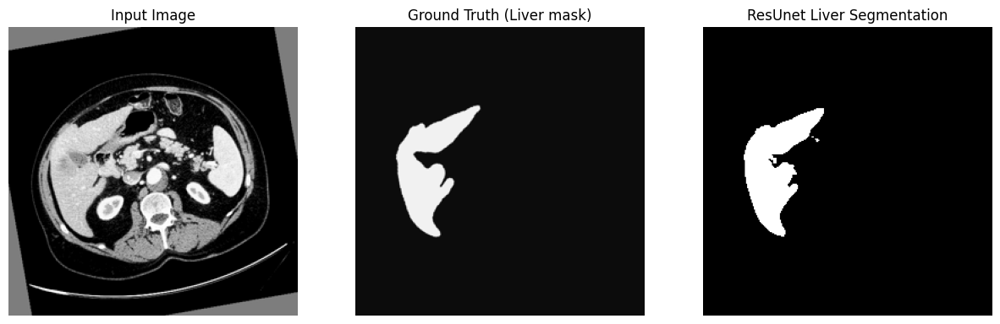

...

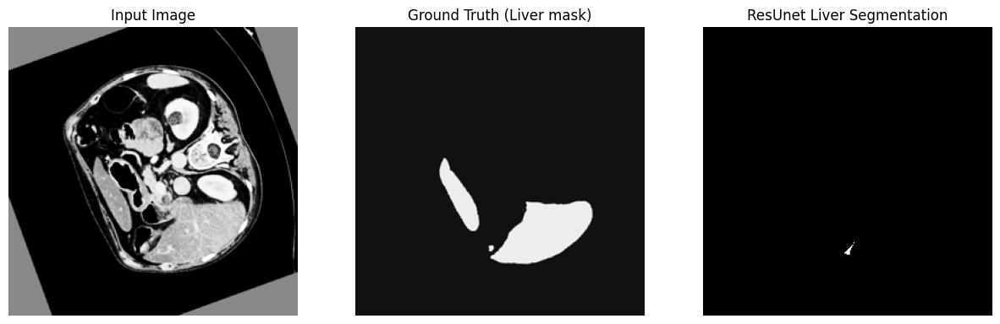

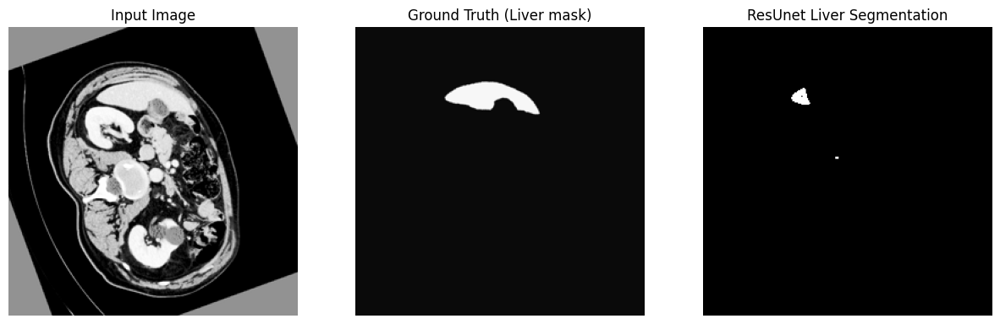

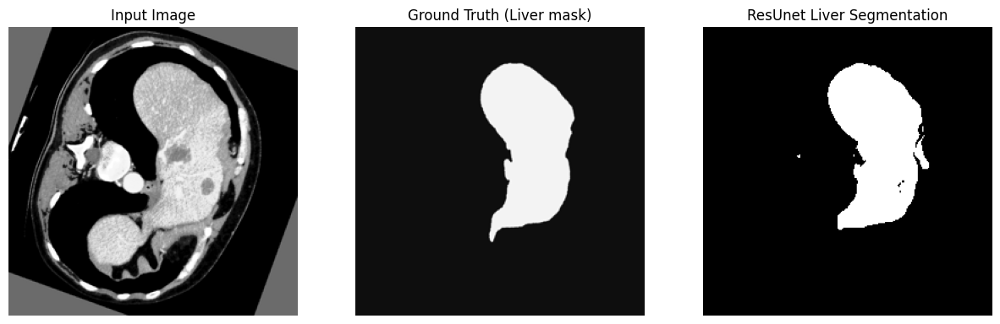

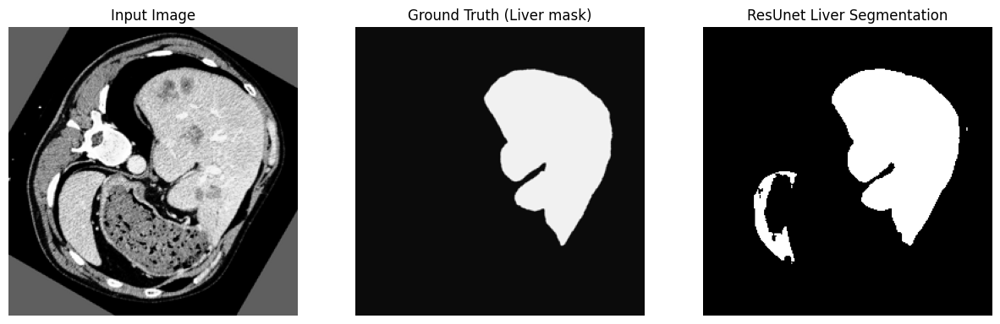

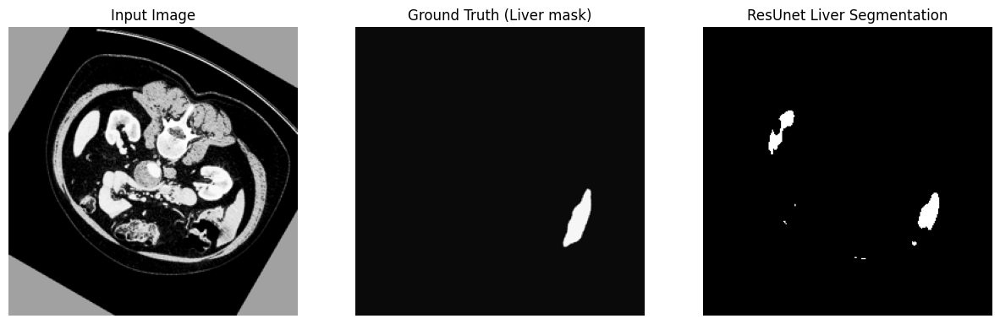

1/1 [==============================] - 10s 10s/step


16


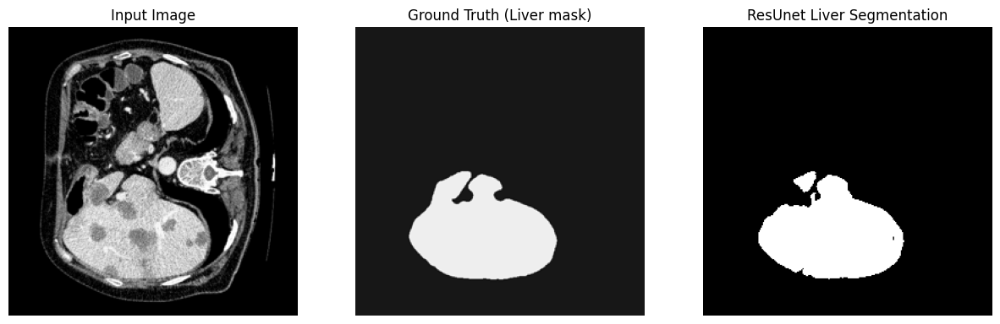

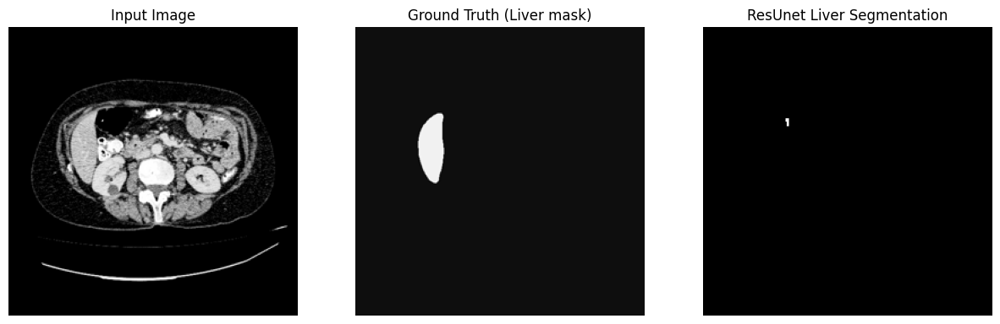

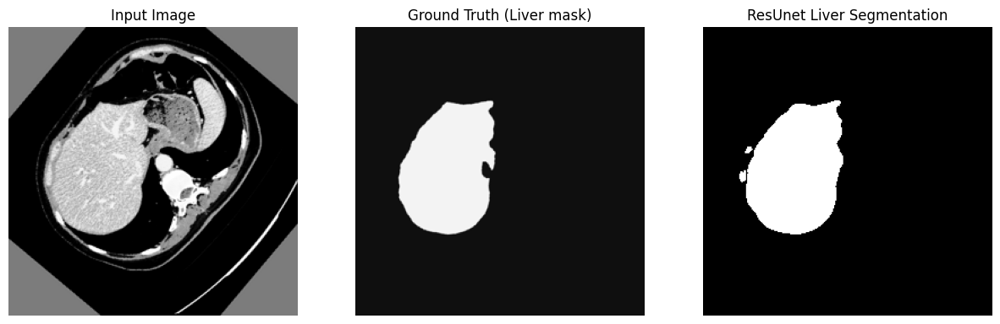

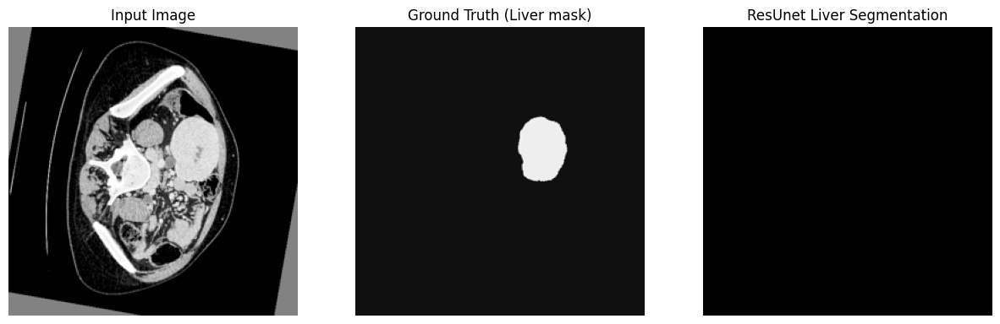

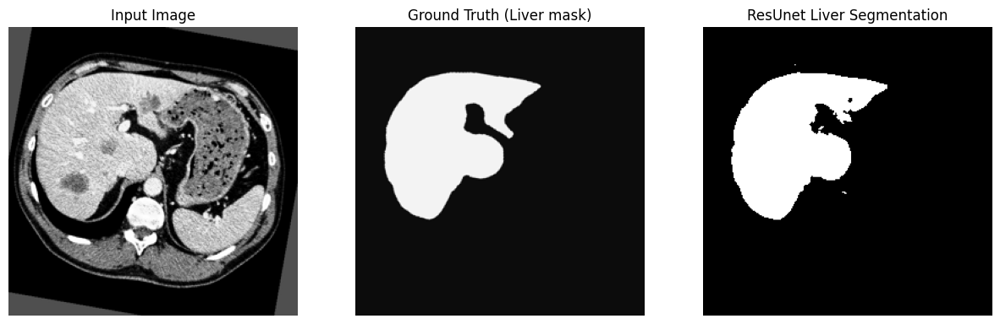

...

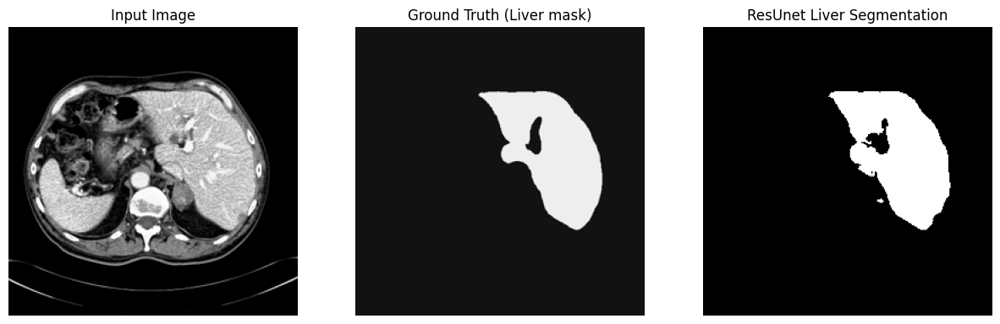

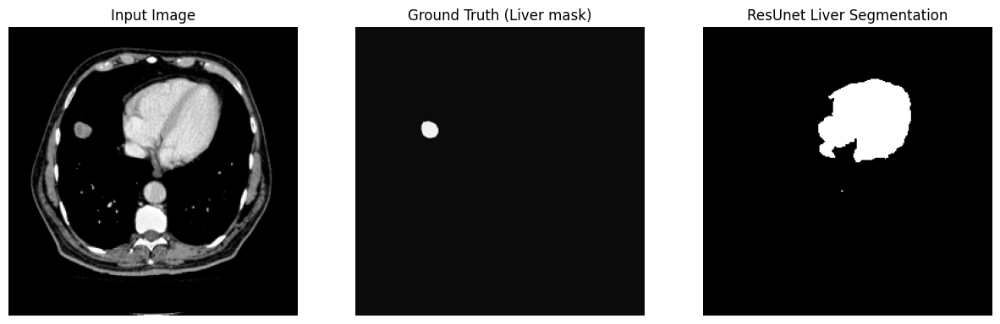

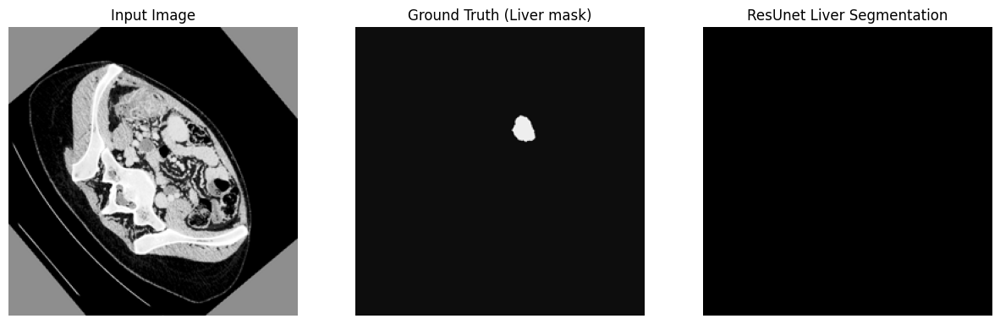

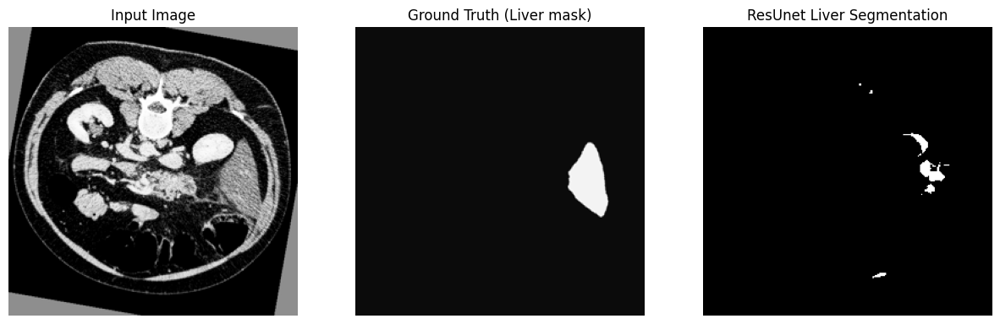

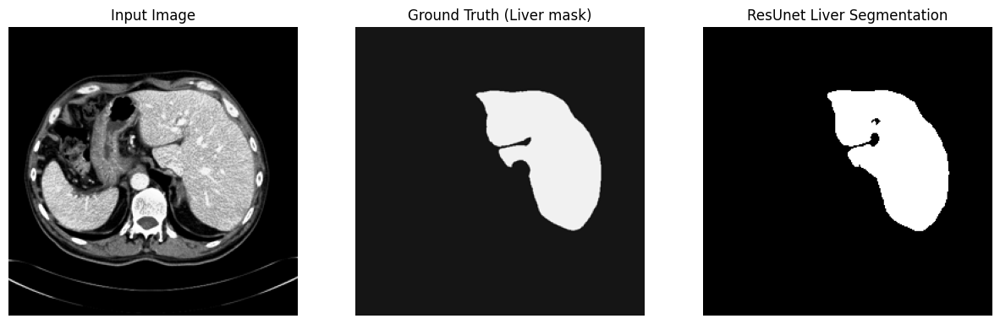

1/1 [==============================] - 9s 9s/step


16


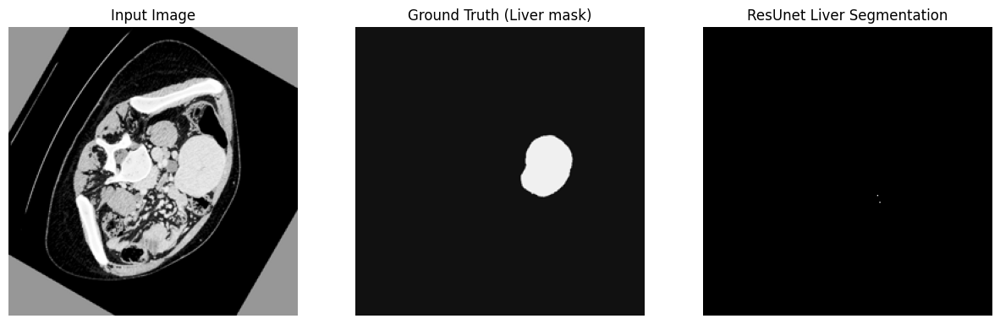

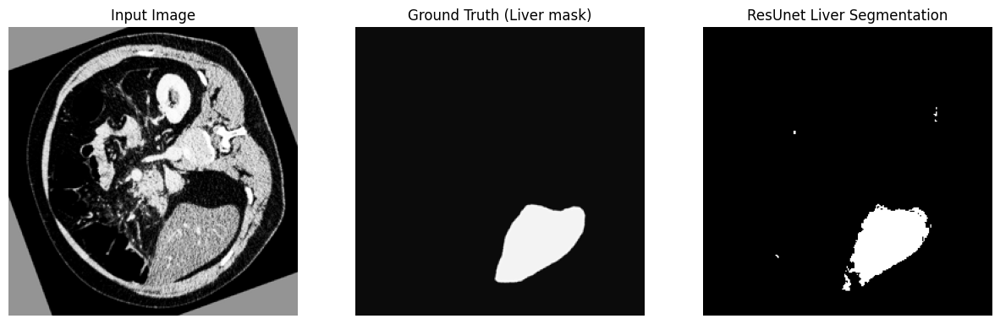

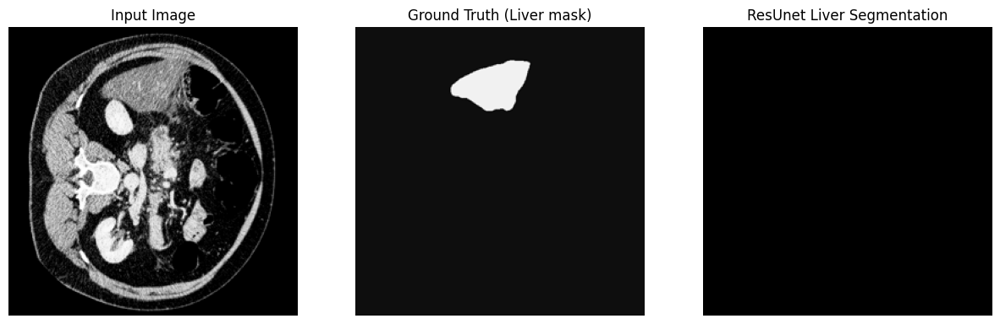

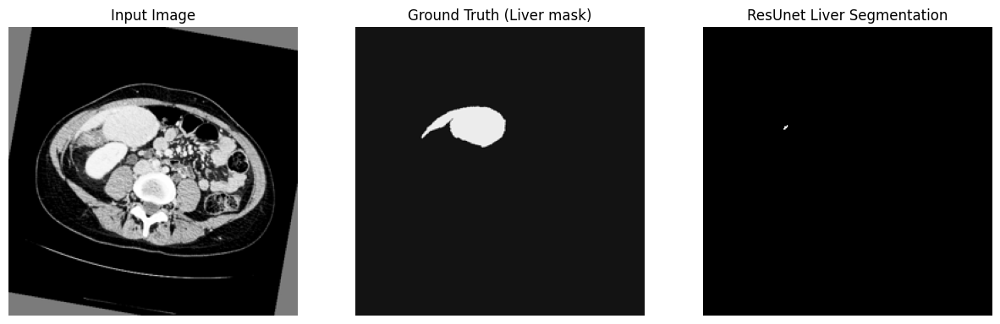

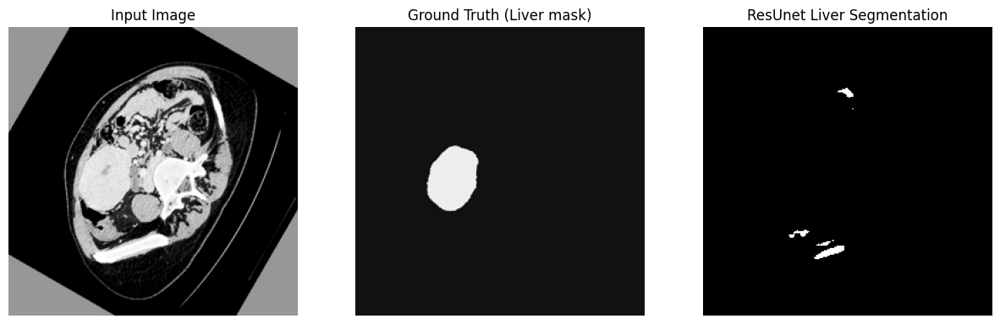

...

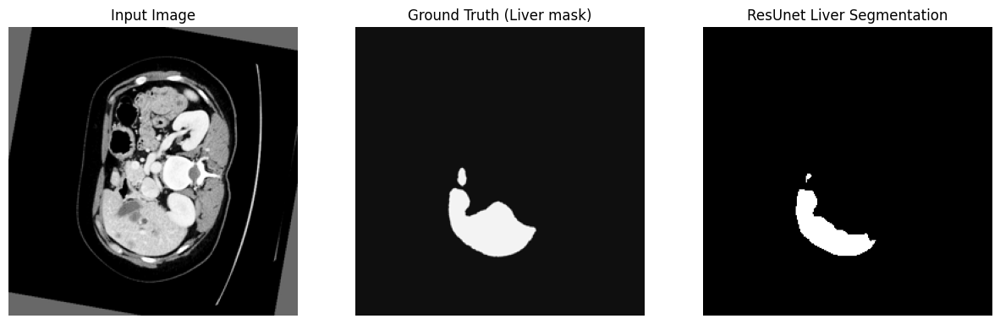

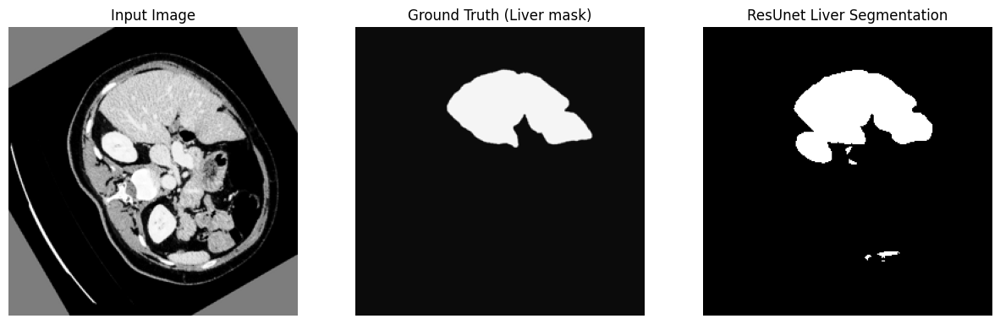

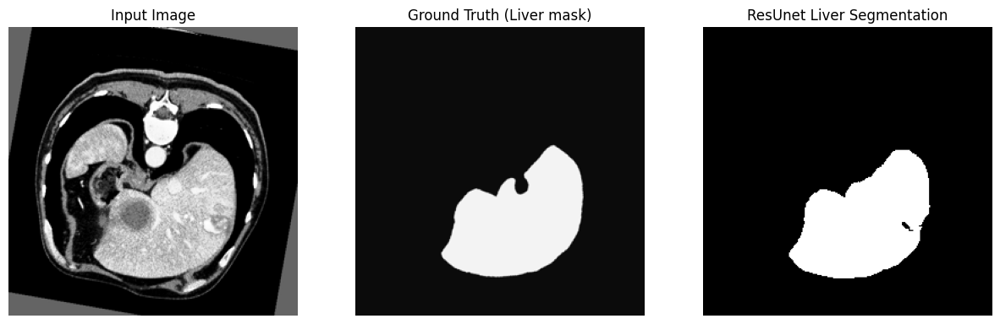

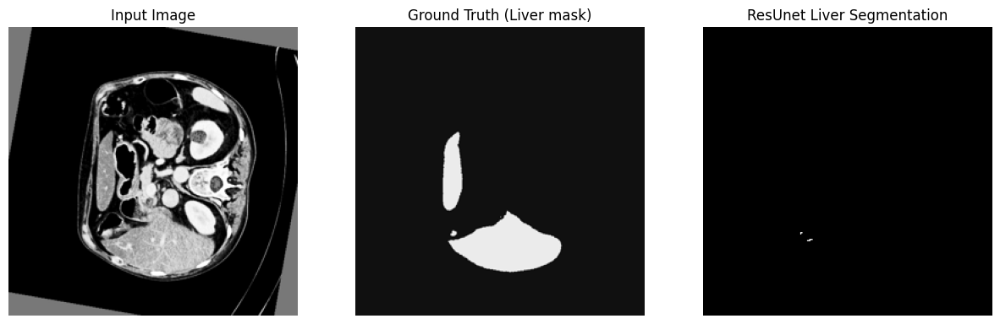

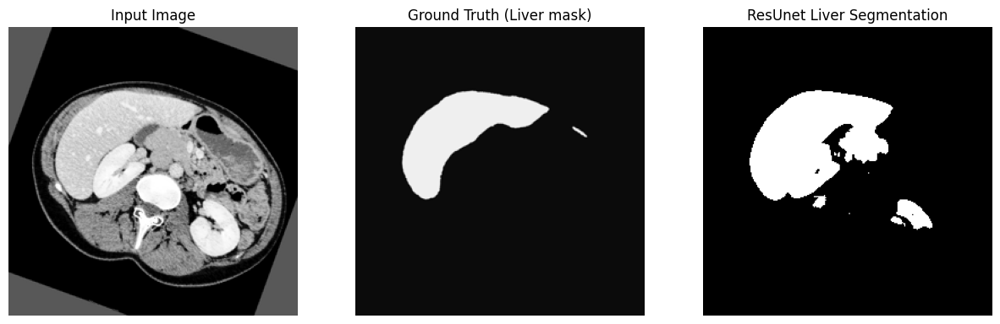

In [ ]:
test_gen_25 = DataGenerator(test_ids, train_path, image_size=image_size, batch_size=batch_size)

visualize(model_25,test_gen_25)

#Visualizing results on test set (when ResUnet is trained on 50% of our data)

1/1 [==============================] - 11s 11s/step


16


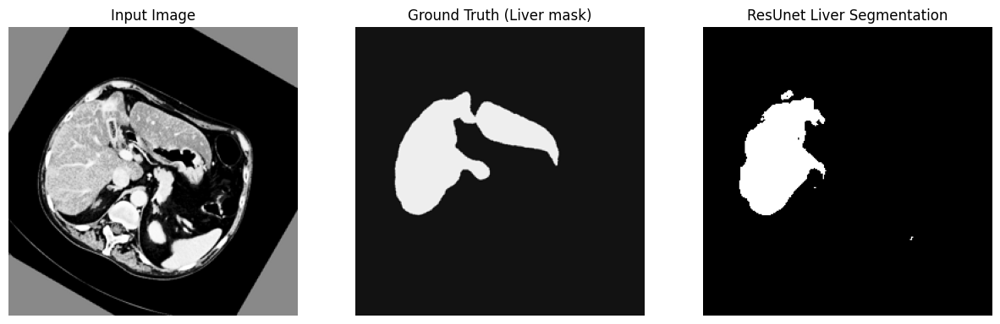

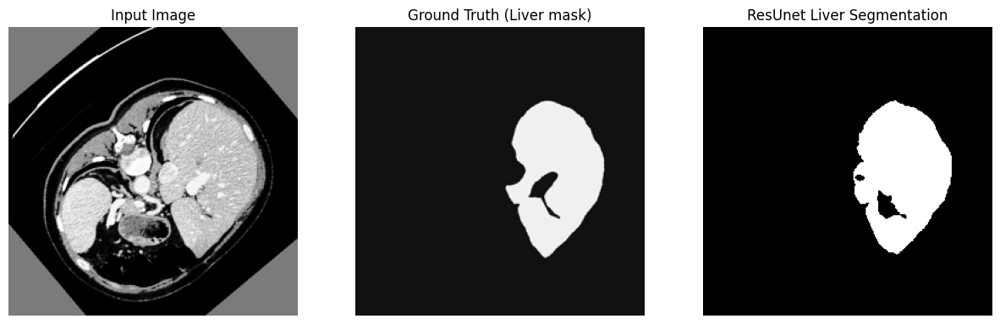

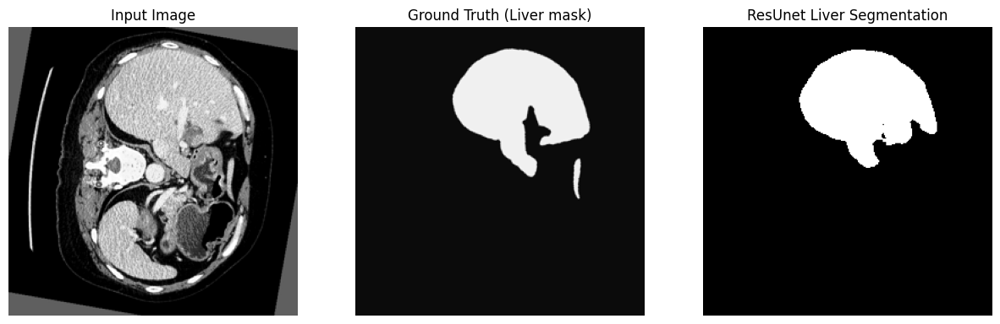

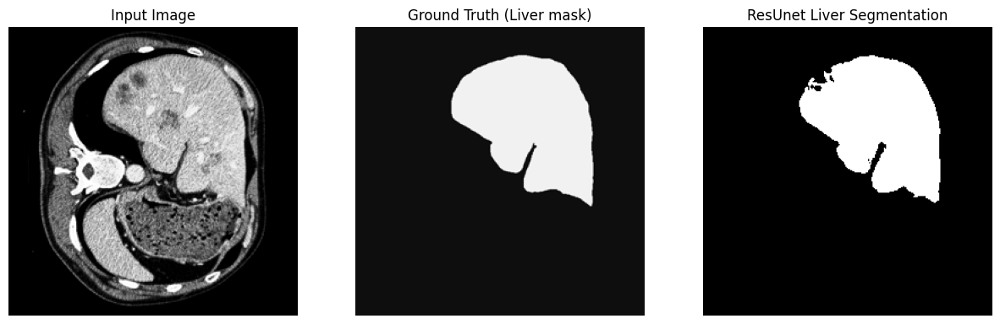

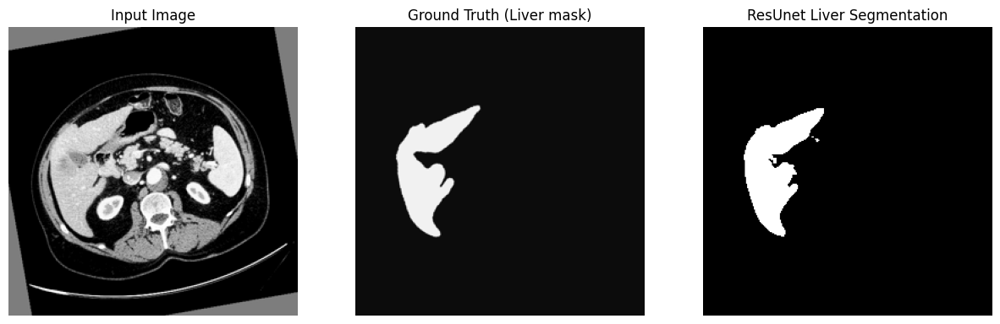

...

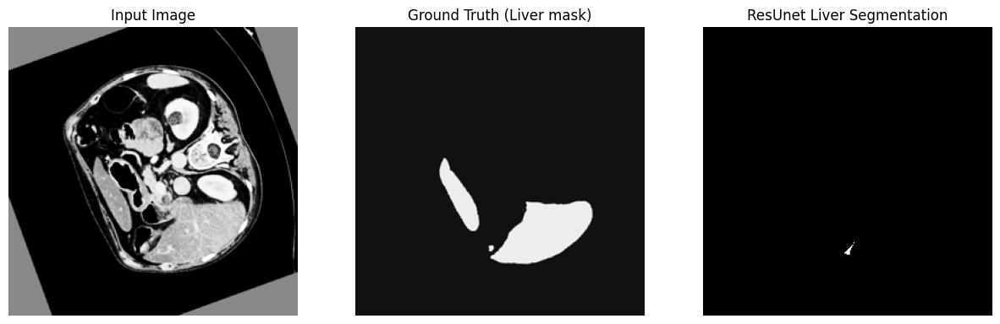

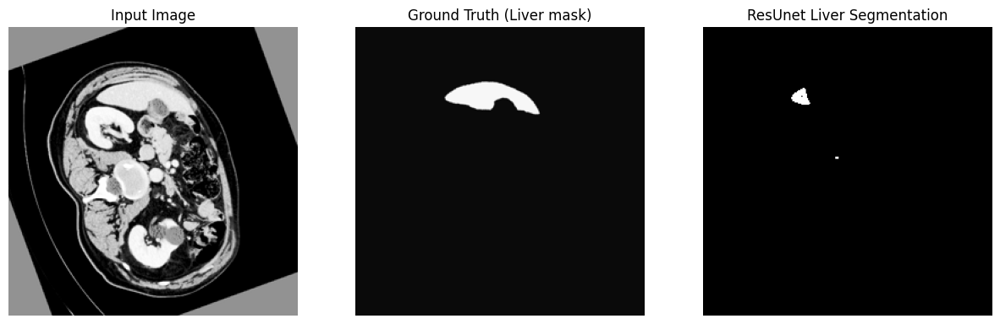

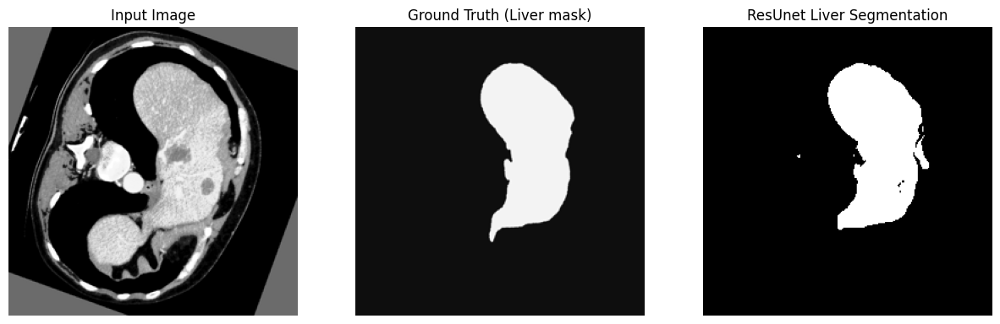

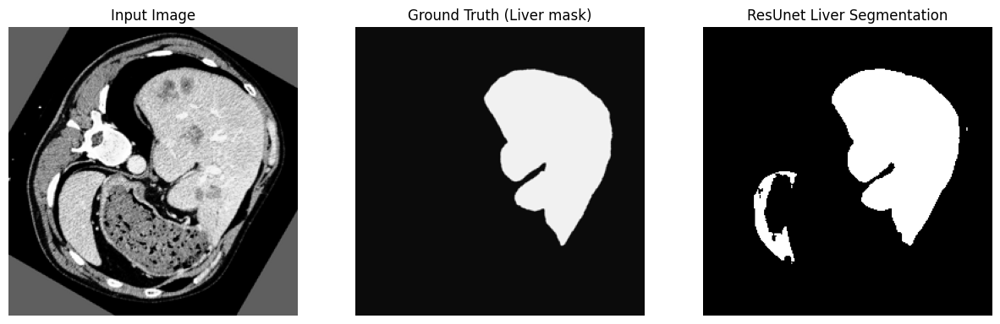

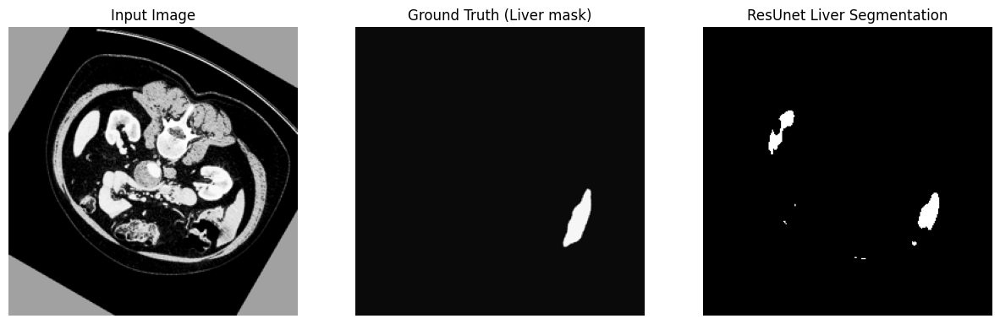

1/1 [==============================] - 10s 10s/step


16


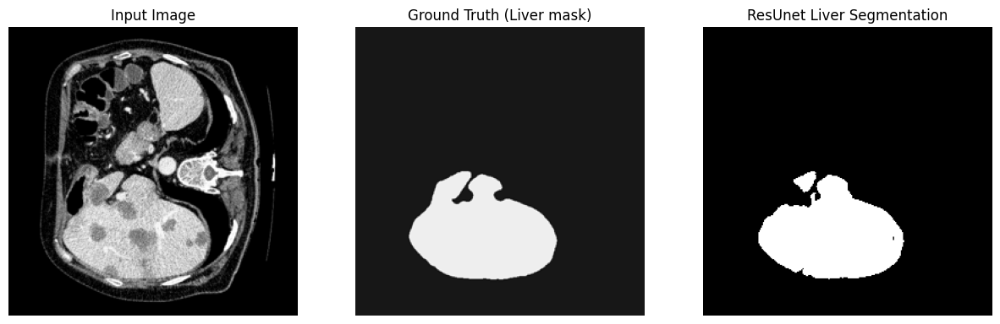

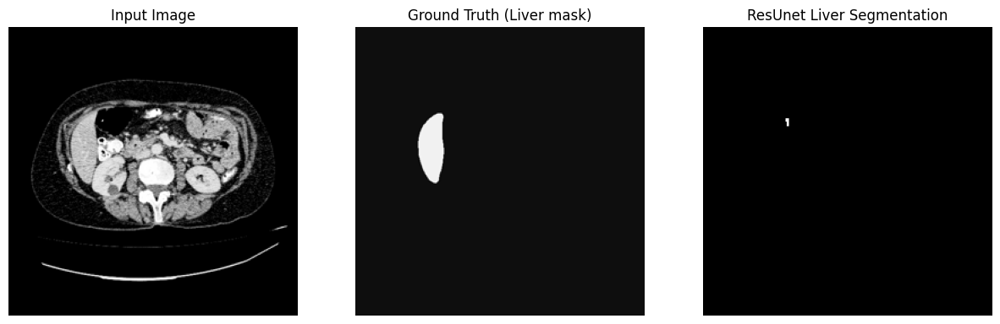

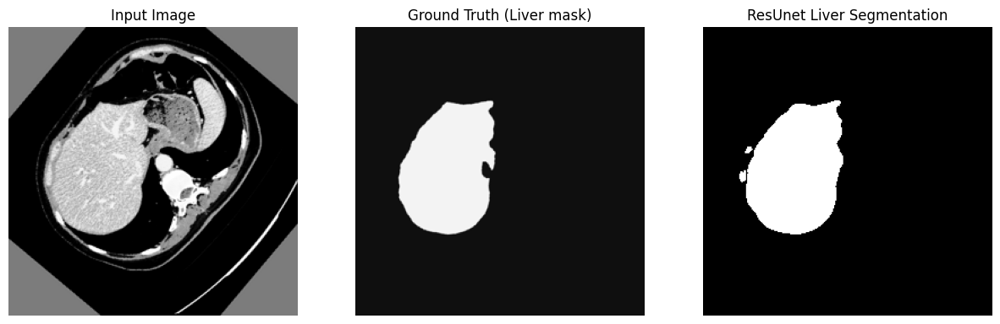

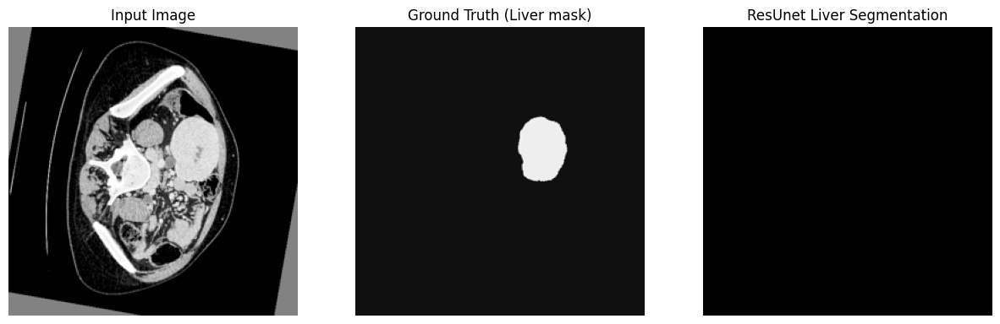

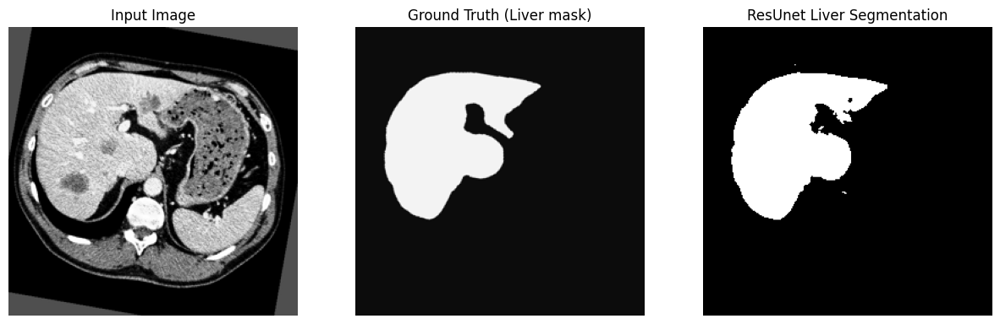

...

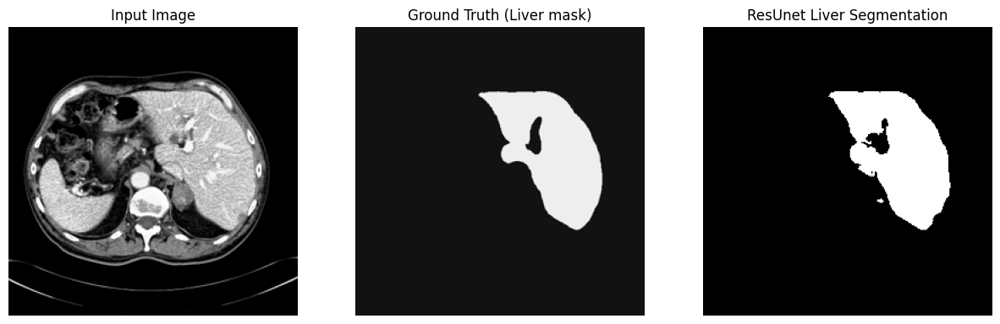

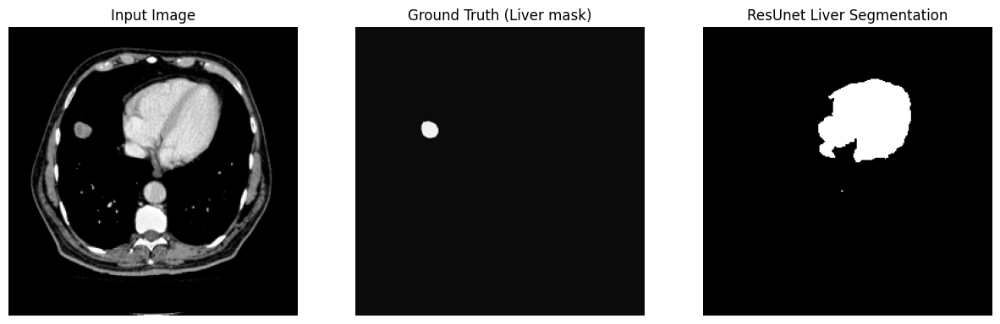

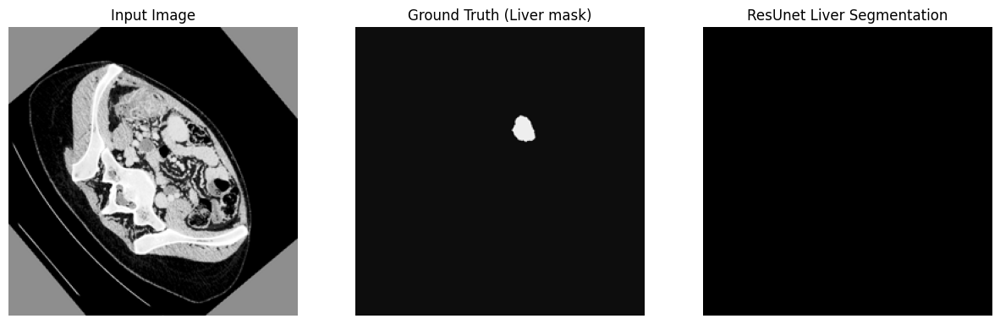

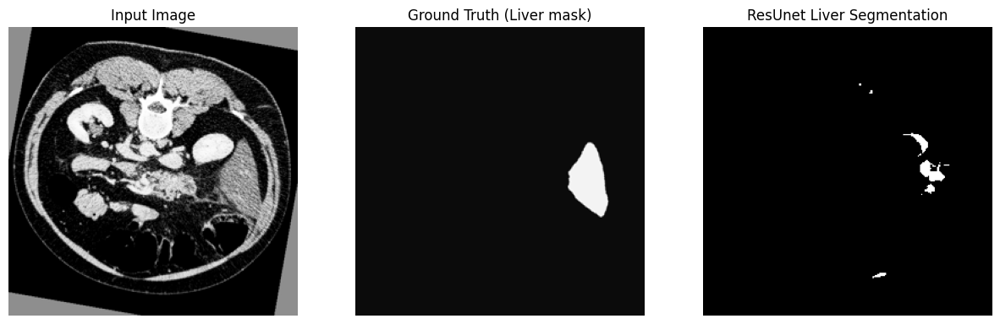

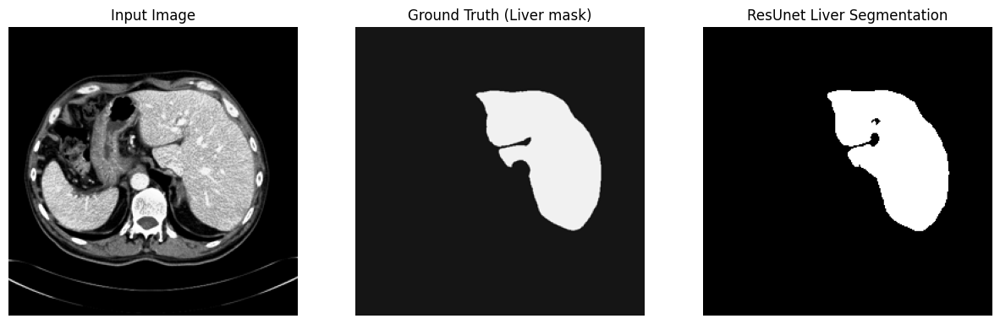

1/1 [==============================] - 9s 9s/step


16


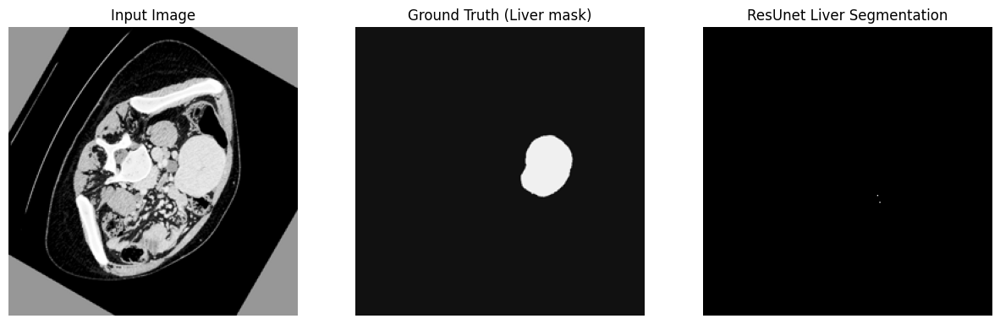

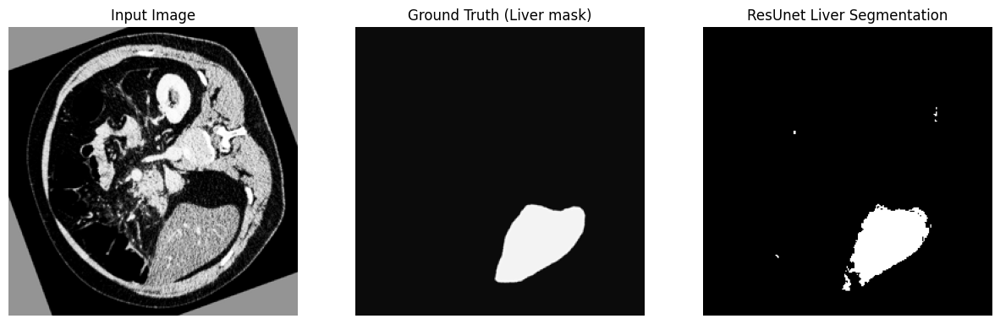

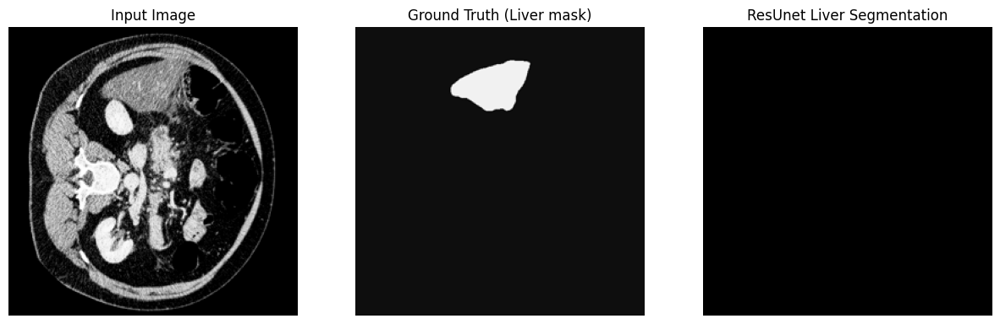

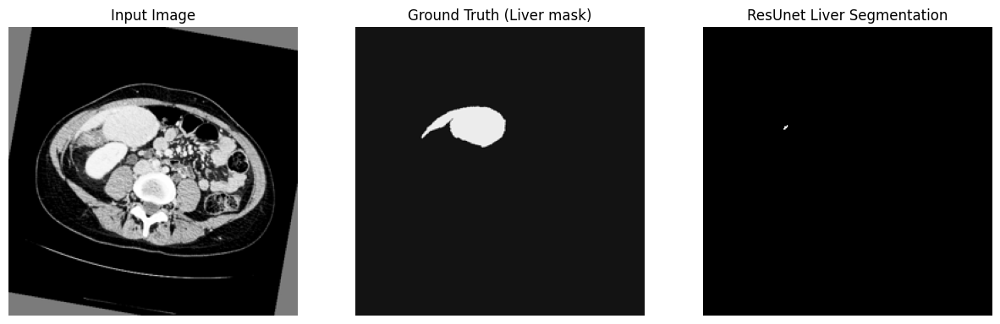

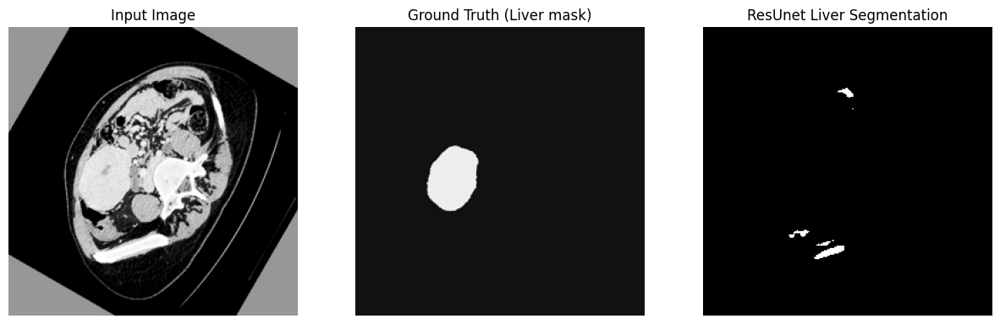

...

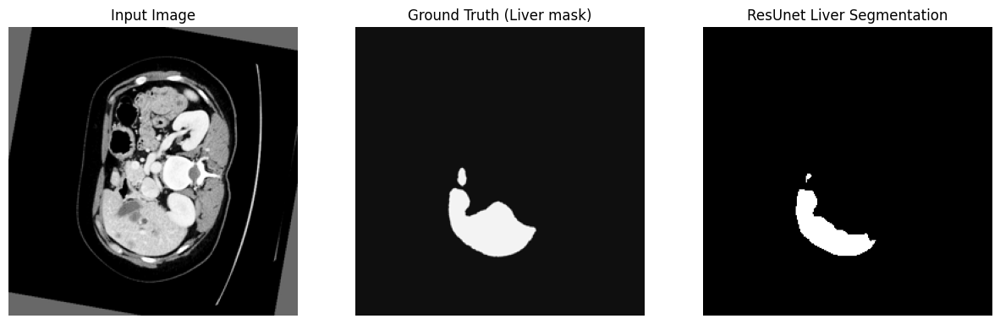

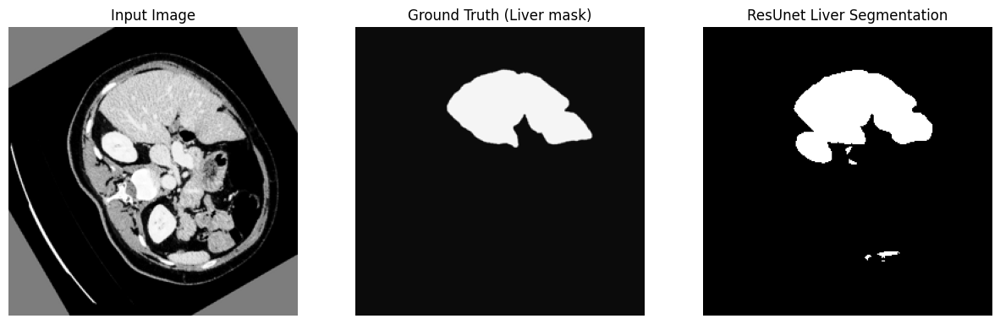

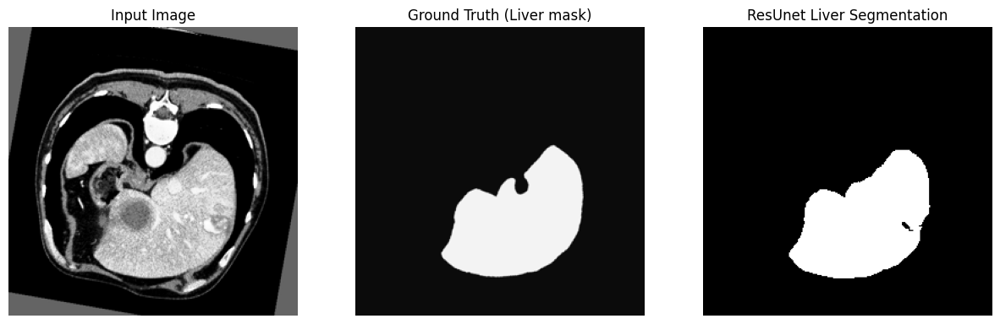

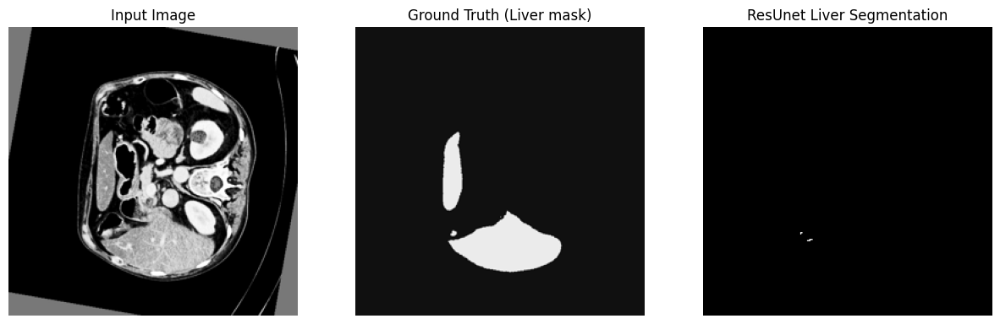

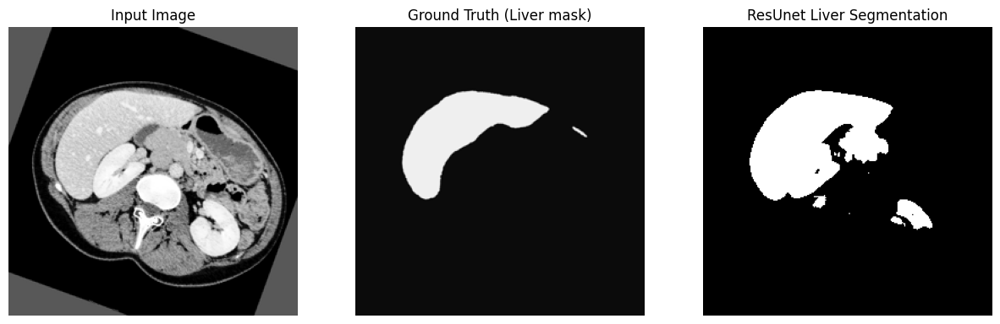

In [ ]:
model_50 = keras.models.load_model(os.path.join('models','liver_segmentation_50percent.h5'), compile= False)
test_gen_50 =DataGenerator(test_ids, train_path, image_size=image_size, batch_size=batch_size)

visualize(model_50,test_gen_50)


#Visualizing results on test set (when ResUnet is trained on 100% of our data)

1/1 [==============================] - 14s 14s/step


16


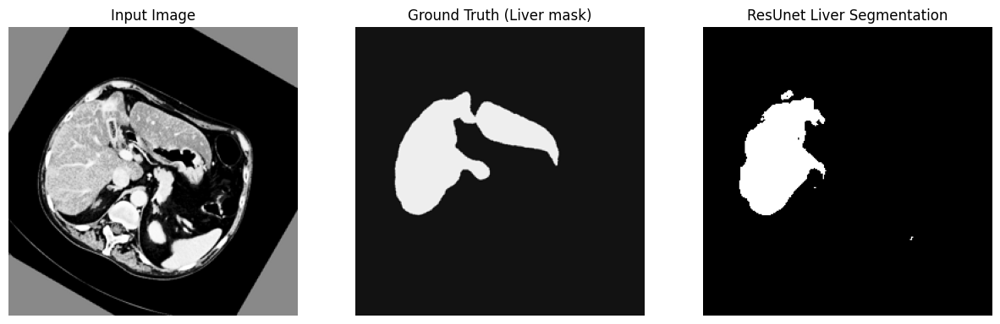

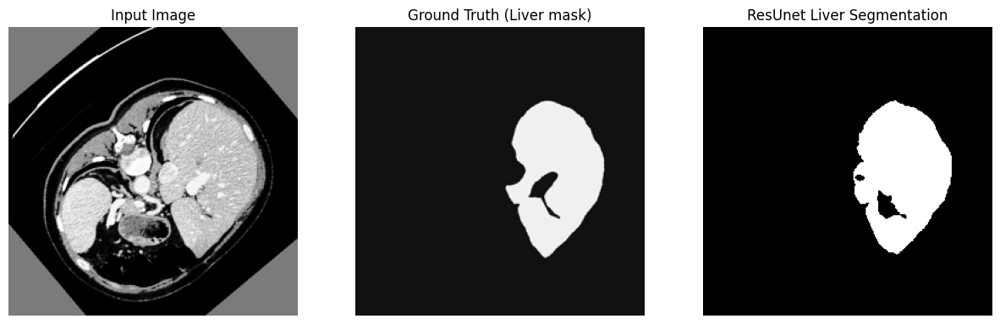

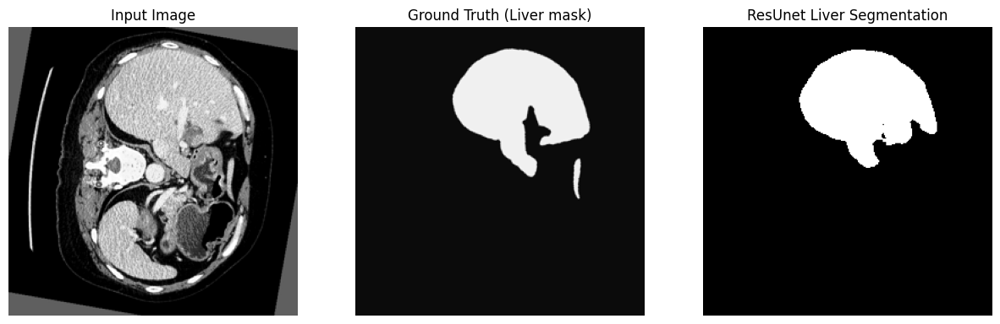

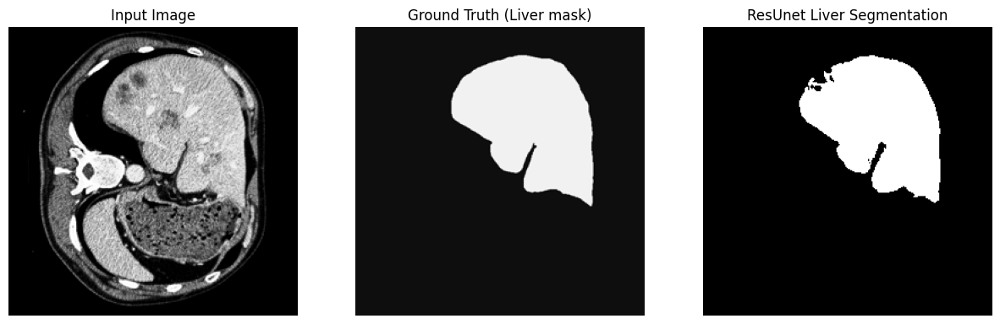

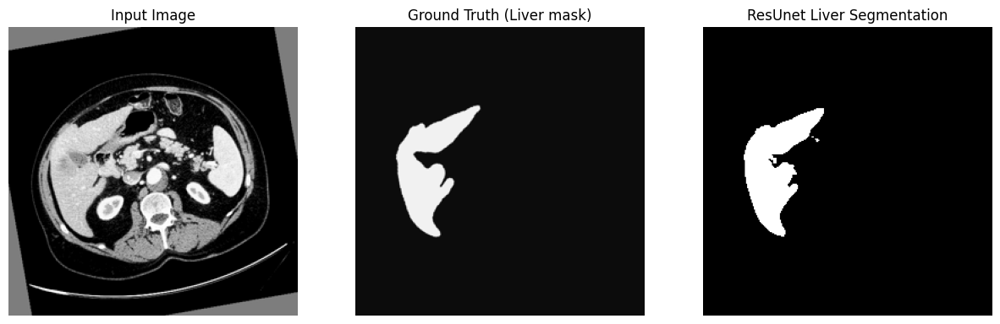

...

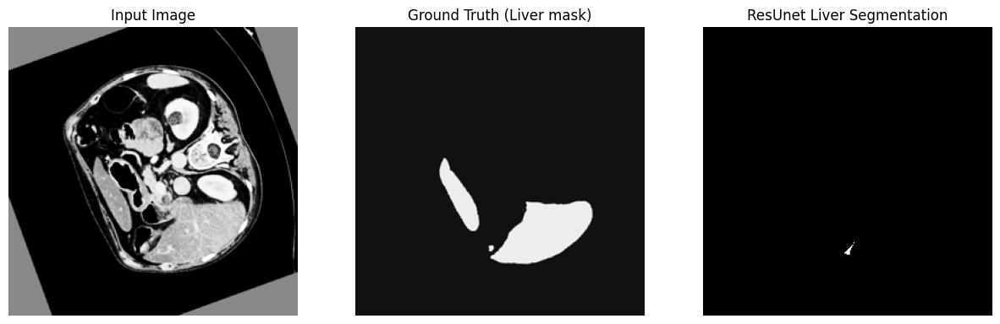

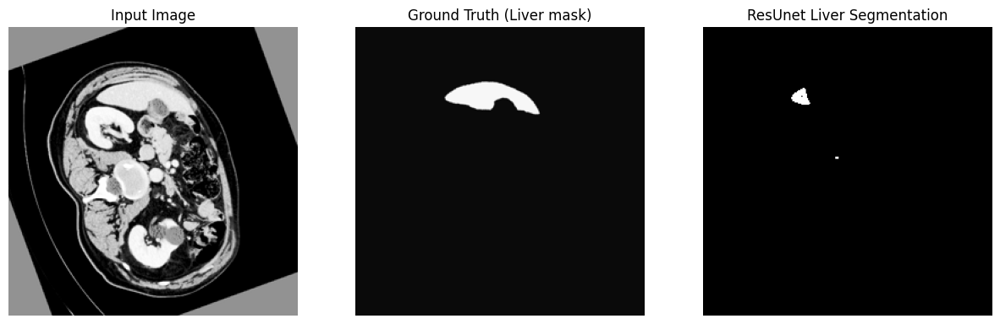

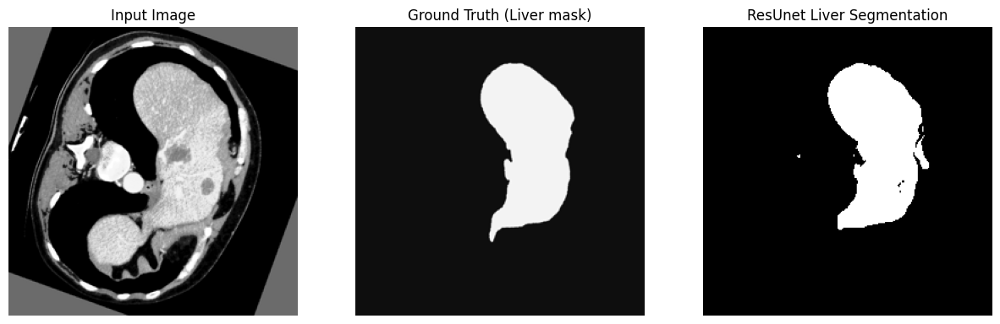

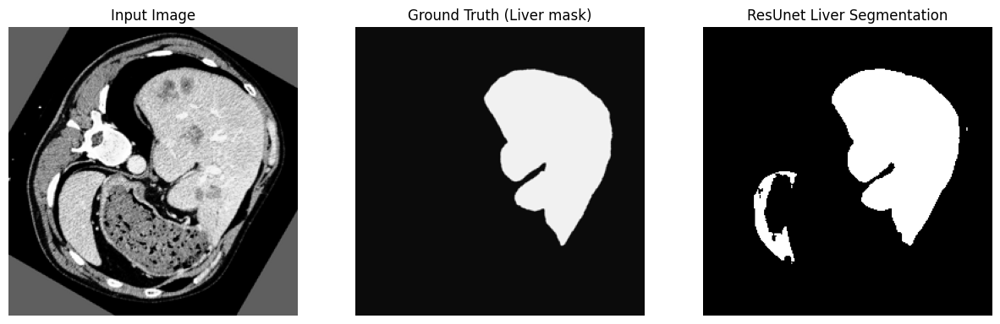

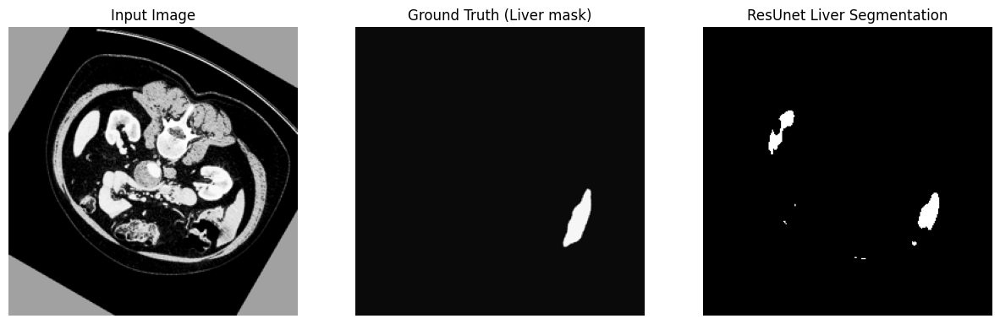

1/1 [==============================] - 10s 10s/step


16


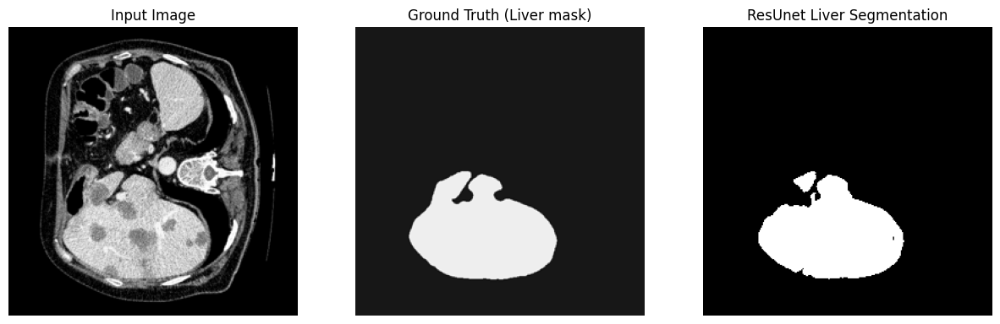

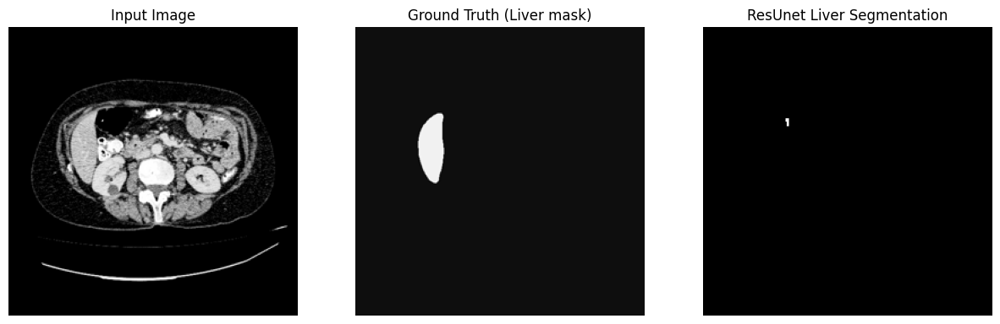

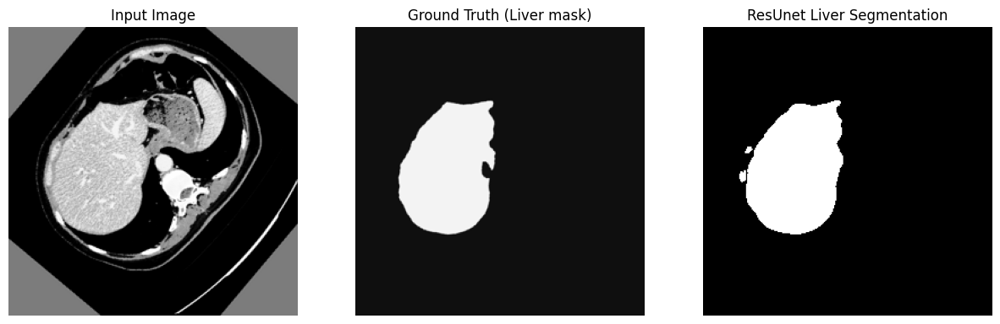

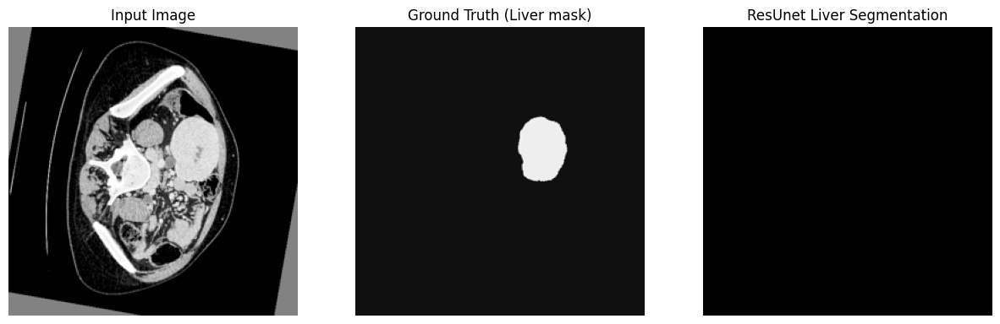

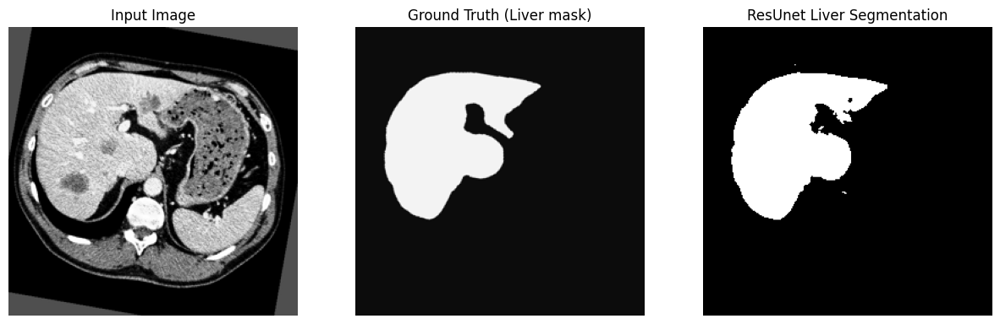

...

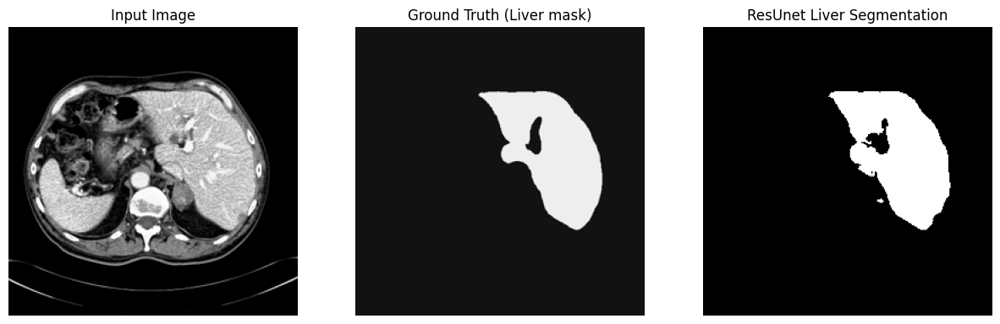

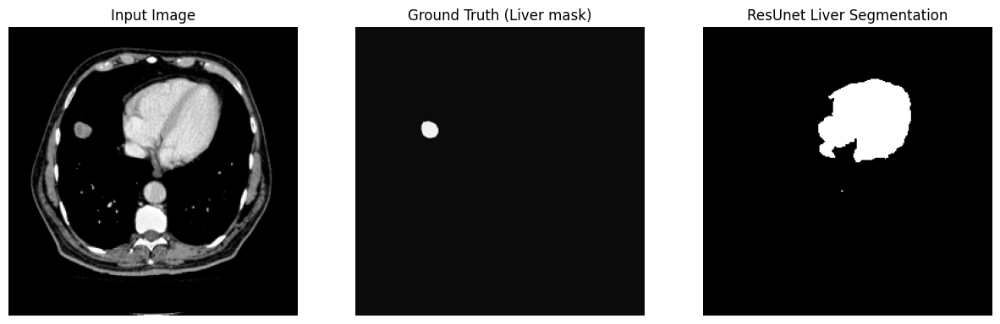

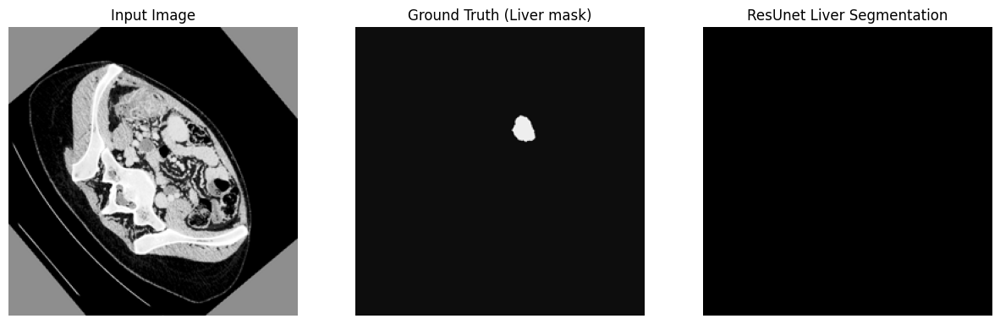

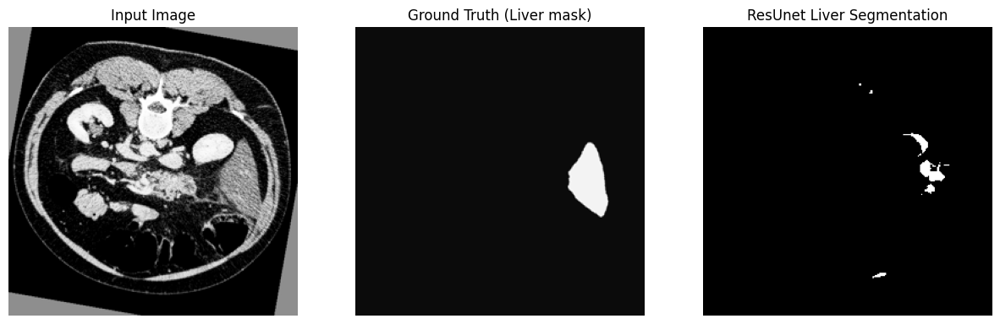

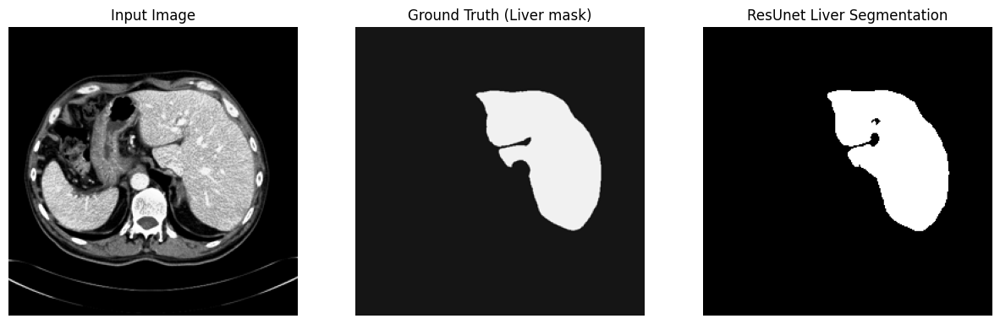

1/1 [==============================] - 16s 16s/step
16


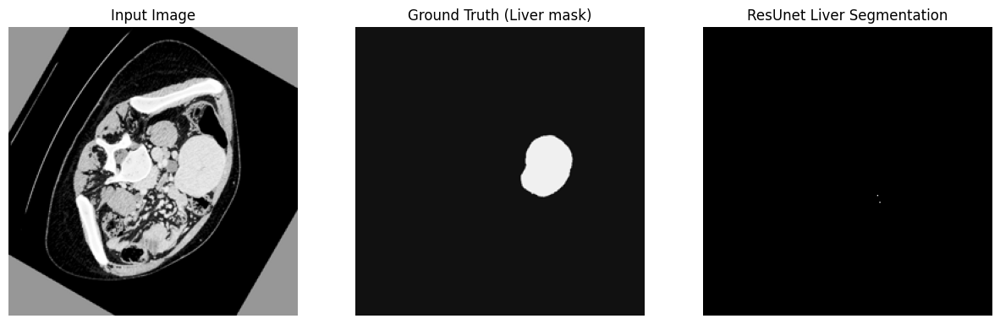

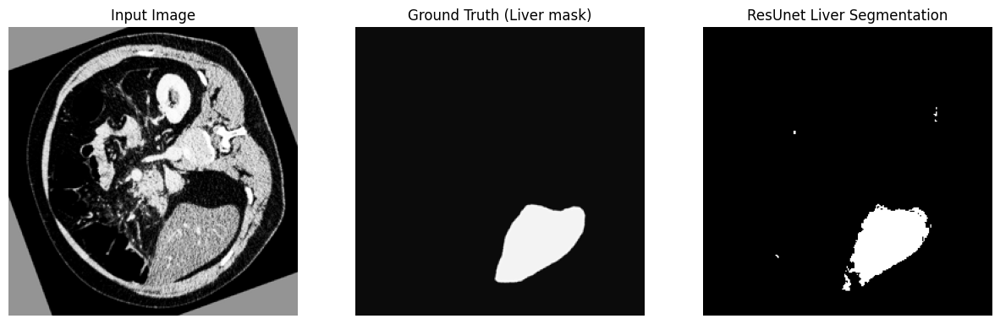

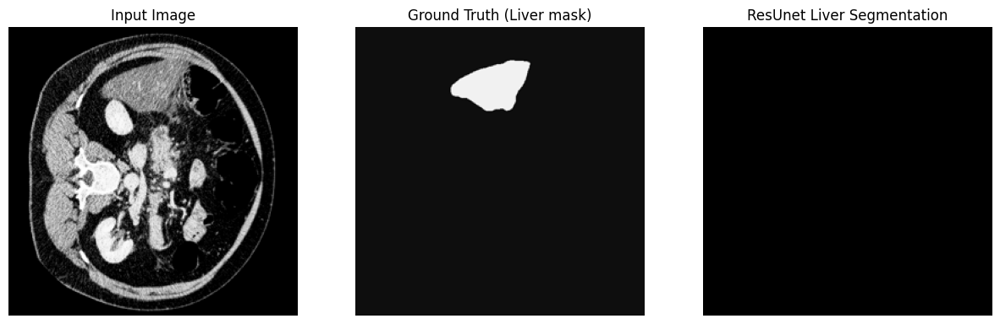

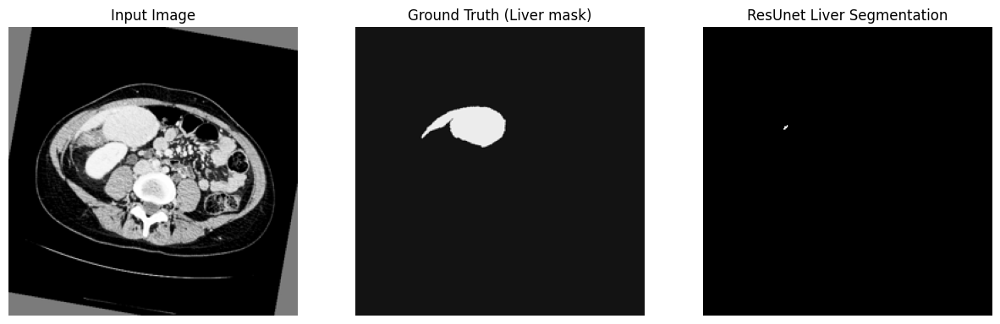

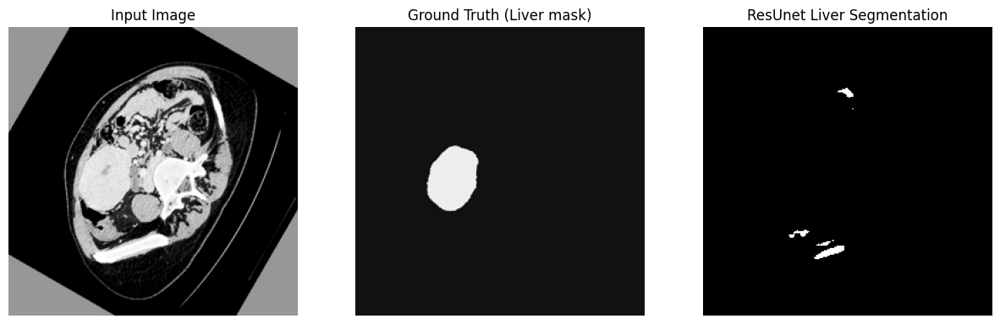

...

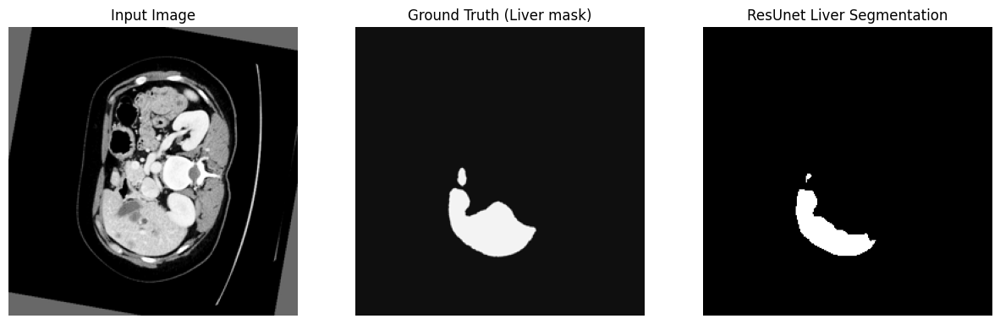

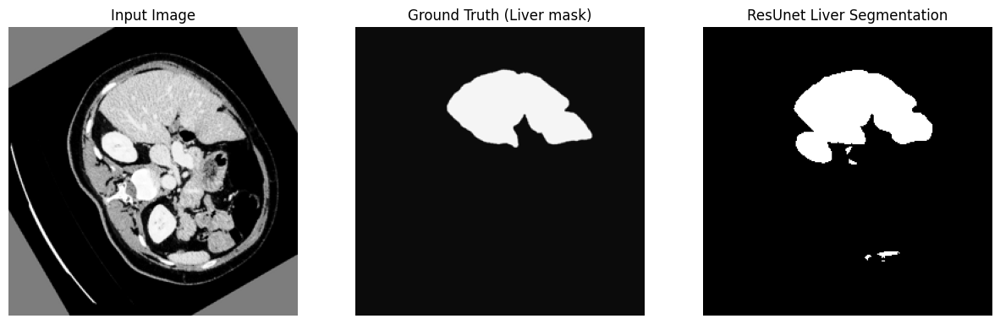

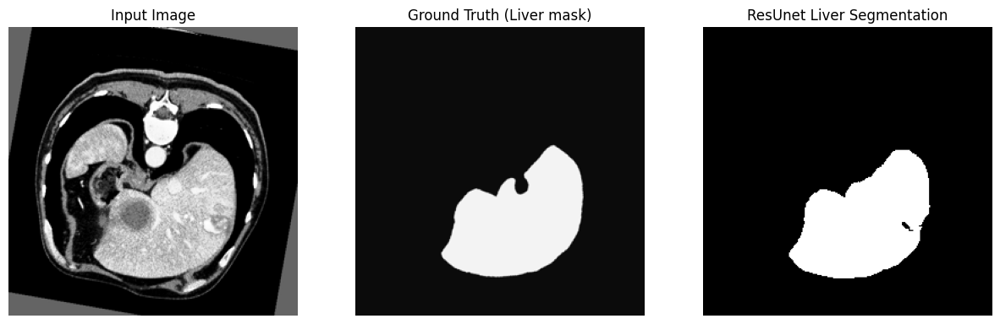

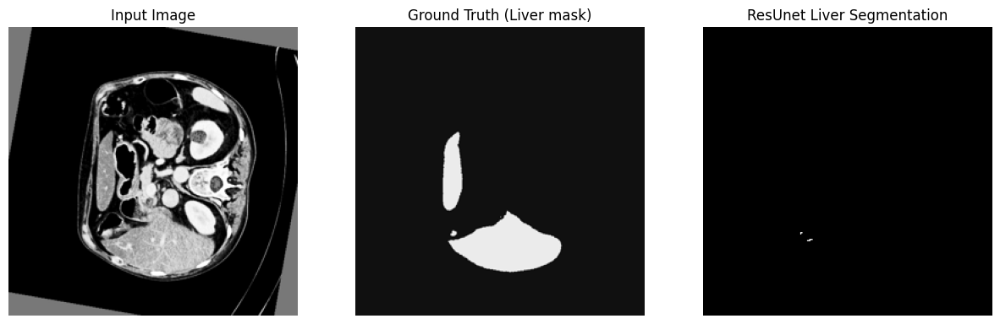

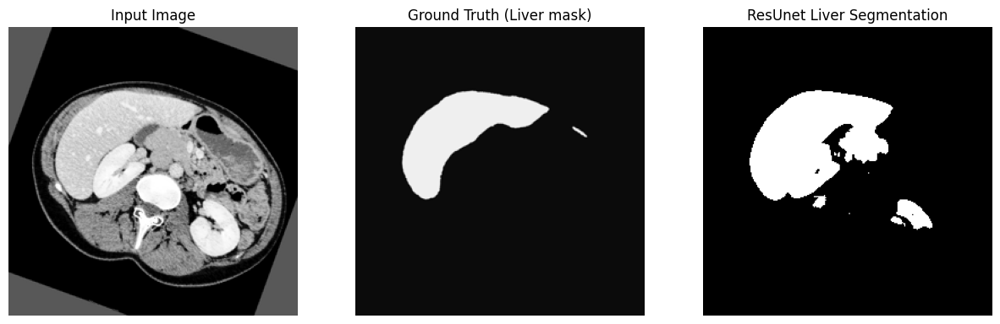

In [ ]:
model_100 = keras.models.load_model(os.path.join('models','liver_segmentation_100percent.h5'), compile= False)
test_gen_100 = DataGenerator(test_ids, train_path, image_size=image_size, batch_size=batch_size)

visualize(model_100,test_gen_100)

#Plotting confusion matrix and calculating evaluation metrics for a randomly select sample

In [ ]:
def dice(im1, im2):

    im1 = np.asarray(im1).astype(np.bool)
    im2 = np.asarray(im2).astype(np.bool)

    if im1.shape != im2.shape:
        raise ValueError("Shape mismatch: im1 and im2 must have the same shape.")

    intersection = np.logical_and(im1, im2)

    return 2. * intersection.sum() / (im1.sum() + im2.sum())

1/1 [==============================] - 14s 14s/step


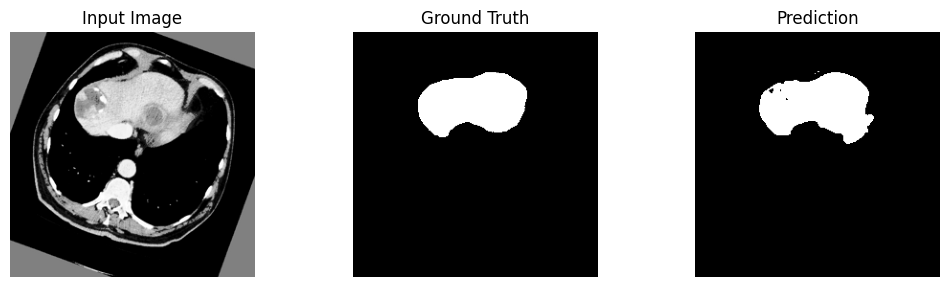

IoU: 0.88%
Pixel Accuracy: 98.86%
True Positive Accuracy: 95.80%
Dice Coefficient: 0.9365


In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import warnings

warnings.filterwarnings("ignore")

random_batch = 7
random_sample = 8

x, y = test_gen_100.__getitem__(random_batch)
result = model_50.predict(x)
result = result > 0.5

# Binarize the ground truth
y_binary = (y > 0.5).astype(int)

# Display the input image, Ground Truth, and Prediction in one line
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 6))
fig.subplots_adjust(wspace=0.4)

# Display the input image
ax1.imshow(x[random_sample], cmap="gray")
ax1.axis('off')
ax1.set_title("Input Image")

# Display the Ground Truth
ax2.imshow(np.reshape(y_binary[random_sample] * 255, (image_size, image_size)), cmap="gray")
ax2.axis('off')
ax2.set_title("Ground Truth")

# Display the Prediction
ax3.imshow(np.reshape(result[random_sample] * 255, (image_size, image_size)), cmap="gray")
ax3.axis('off')
ax3.set_title("Prediction")

plt.show()

# Calculate confusion matrix and metrics
cm_2d = confusion_matrix(y_binary[random_sample].flatten(), result[random_sample].flatten())
cm = cm_2d.ravel()

pixel_accuracy = (cm[3] + cm[0]) / (cm[3] + cm[0] + cm[1] + cm[2]) * 100
true_positive_accuracy = (cm[3]) / (cm[3] + cm[2]) * 100
dice_coefficient = dice(y_binary[random_sample], result[random_sample])
iou = cm[3] / (cm[3] + cm[1] + cm[2])

print("IoU: {:.2f}%".format(iou))  # Intersection over union
print("Pixel Accuracy: {:.2f}%".format(pixel_accuracy))
print("True Positive Accuracy: {:.2f}%".format(true_positive_accuracy))
print("Dice Coefficient: {:.4f}".format(dice_coefficient))


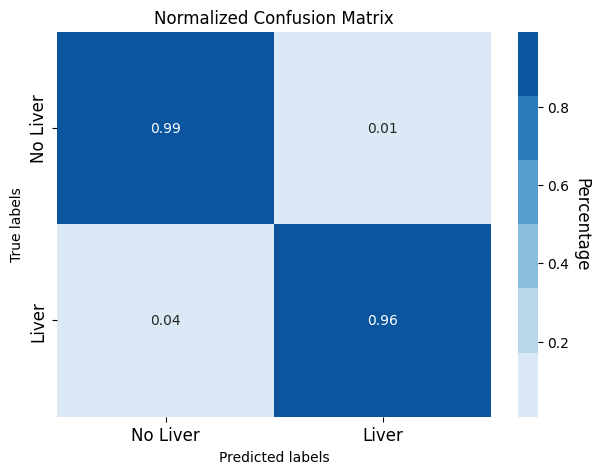

In [ ]:
import seaborn as sns

# Assuming cm_2d is your confusion matrix

# Normalize the confusion matrix
cm_2d_normalized = cm_2d.astype('float') / cm_2d.sum(axis=1)[:, np.newaxis]

cmap = sns.color_palette("Blues")

# Plot the normalized confusion matrix
plt.figure(figsize=(7, 5))
ax = plt.subplot()

sns.heatmap(cm_2d_normalized, annot=True, fmt=".2f", cmap=cmap, cbar=True, ax=ax)

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Normalized Confusion Matrix')

ax.xaxis.set_tick_params(labelsize=12)
ax.yaxis.set_tick_params(labelsize=12)

cbar = ax.collections[0].colorbar
cbar.set_label('Percentage', rotation=270, labelpad=15, fontsize=12)

ax.set_xticklabels(['No Liver', 'Liver'])
ax.set_yticklabels(['No Liver', 'Liver'])

plt.show()
